# Phase 4 Project - NBA Player Similarity Recommendation System

Please fill out:

- Student name: Troy Hendrickson
- Student pace: Full time
- Scheduled project review date/time: December 9th, 2022
- Instructor name: Joseph Mata
- Blog post URL: https://troykhendrix22.blogspot.com/

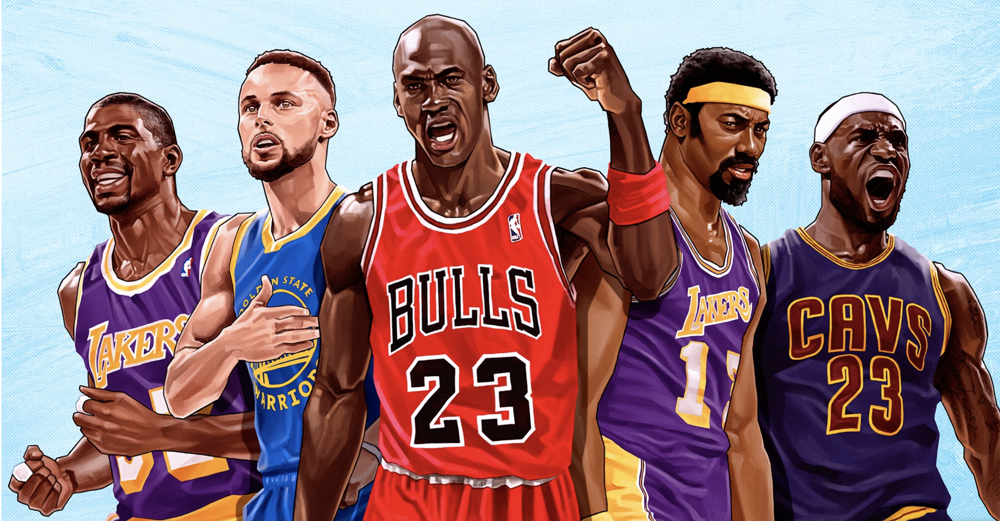

# Overview

This project analyzes existing data about various players in the nba currently as well as players who are retired and have played in the past. We use this data in order to develop a predictive model that can determine what features are most important when trying to understand what players are most similar to each other using advanced stats. This data gave us advanced stats on how each player impacted the floor beyond just the box score numbers. After utilizing the process of exploratory data analysis, I created several models to eventually reach the model with the highest and most appropriate score.

# Business Problem

It is well known that building a championship team in the NBA is probably the hardest amongst all the other well known sports in the country. When your team has a player that can takeover the entire game, it is the ultimate advantge on a nightly basis. However, what do you do when that player decides to leave your team? Scouts and front office executives have been dealing with this issue, especially in the modern age starting from when LeBron James made his big decision. It can be crucial to a team when a star player has decided to leave and you are stuck with the problem of trying to replace that player. This recommendation system is built to tell scouts which players are the most similar to each other stats wise to give scouts a better idea of who to target when a problem like this arises.   

# Data Understanding

The data that I used for this project comes from a dataset from FiveThirtyEight titled, 'The Best NBA Players, According To RAPTOR' and also a data set from Kaggle titled 'NBA season Stats'. This source is comprised of advanced stats that go beyond the box score and takes into effect the pace of the game, spacing, and the offensive and defensive nuances of the game. This gives stats of all players dating all the way back to 1977. 

# Load Imports

In [1]:
#Basics
import numpy as np
import pandas as pd
from IPython.display import Markdown, display
import warnings
warnings.filterwarnings("ignore")

# Data visualizations
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import plot_roc_curve
%matplotlib inline
from sklearn.metrics import recall_score, confusion_matrix, plot_confusion_matrix, ConfusionMatrixDisplay

# Pre-Processing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from imblearn.over_sampling import RandomOverSampler

# Modeling
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report
from surprise.similarities import cosine, msd, pearson
from surprise import accuracy


# Metrics
from sklearn.metrics import accuracy_score,recall_score
from sklearn.metrics import roc_curve
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error


# Load in Data Set

In [2]:
nbadf = pd.read_csv("historical_RAPTOR_by_player.csv")
nbadf.describe()

,season,poss,mp,raptor_offense,raptor_defense,raptor_total,war_total,war_reg_season,war_playoffs,predator_offense,predator_defense,predator_total,pace_impact
count,19159.000000,19159.000000,19159.000000,19159.000000,19159.000000,19159.000000,19159.000000,19159.000000,19159.000000,19159.000000,19159.000000,19159.000000,19158.000000
mean,2001.911686,2753.459836,1363.018477,-1.282572,-0.336641,-1.619213,1.980890,1.791916,0.188974,-1.285501,-0.533616,-1.819117,0.196519
std,12.991213,2032.700765,1003.793897,3.502971,2.467030,4.525422,3.458863,3.074403,0.589576,3.218998,2.305877,4.435724,0.827142
min,1977.000000,1.000000,0.000000,-82.192072,-56.982520,-103.084801,-7.382978,-7.382978,-1.376520,-71.510086,-37.871745,-101.442650,-7.191955
25%,1991.000000,883.000000,440.000000,-2.828729,-1.412329,-3.574572,-0.114100,-0.114928,0.000000,-2.860883,-1.631094,-3.989563,-0.241770
50%,2003.000000,2549.000000,1262.000000,-1.112462,-0.406899,-1.365128,0.586046,0.556030,0.000000,-1.191378,-0.532853,-1.628693,0.093278
75%,2013.000000,4345.500000,2144.500000,0.547465,0.707465,0.747604,3.106047,2.901287,0.072959,0.468142,0.628289,0.691144,0.517431
max,2022.000000,9271.000000,4270.000000,53.228864,62.469205,72.622361,28.762877,24.355978,7.006934,42.890281,42.989063,49.106166,23.732063


In [3]:
nbadf1 = pd.read_csv('cleaned_data.csv')
nbadf1.describe()

,Unnamed: 0,Wt,Age,G,GS,MP,FG,FGA,FG%,3P,...,Pts Won,Pts Max,Share,W,L,W/L%,GB,PS/G,PA/G,SRS
count,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,...,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000,17976.000000
mean,8987.500000,215.879395,26.678961,54.055685,27.303238,20.496584,3.207682,7.033600,0.441621,0.446495,...,6.388679,39.745160,0.006065,39.731809,40.399366,0.495715,15.840065,102.351307,102.489047,-0.132477
std,5189.368555,27.289579,4.089597,25.253982,29.975434,10.100926,2.286849,4.713654,0.094456,0.634589,...,63.918459,202.645066,0.058911,12.816527,12.783673,0.154865,13.047137,7.262327,7.302082,4.511820
min,0.000000,133.000000,18.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,7.000000,9.000000,0.106000,0.000000,81.900000,83.400000,-14.680000
25%,4493.750000,195.000000,23.000000,35.000000,1.000000,12.100000,1.400000,3.300000,0.405000,0.000000,...,0.000000,0.000000,0.000000,30.000000,31.000000,0.378000,4.000000,96.900000,97.100000,-3.260000
50%,8987.500000,215.000000,26.000000,62.000000,12.000000,20.000000,2.700000,5.900000,0.446000,0.100000,...,0.000000,0.000000,0.000000,41.000000,40.000000,0.512000,14.000000,101.800000,102.500000,-0.010000
75%,13481.250000,235.000000,29.000000,77.000000,55.000000,29.000000,4.600000,9.900000,0.488000,0.700000,...,0.000000,0.000000,0.000000,50.000000,50.000000,0.610000,25.000000,107.700000,107.600000,3.130000
max,17975.000000,360.000000,44.000000,85.000000,84.000000,43.700000,13.400000,27.800000,1.000000,5.300000,...,1310.000000,1310.000000,1.000000,73.000000,72.000000,0.890000,56.000000,126.500000,130.800000,11.800000


In [4]:
# Left merge both data sets together 
nba = nbadf.merge(nbadf1, how = 'left', left_on = 'player_name', right_on = 'Player')
pd.set_option('display.max_columns', None)
nba.head()

,player_name,player_id,season,poss,mp,raptor_offense,raptor_defense,raptor_total,war_total,war_reg_season,war_playoffs,predator_offense,predator_defense,predator_total,pace_impact,Unnamed: 0,Player,Ht,Wt,Colleges,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Year,Pts Won,Pts Max,Share,Team,W,L,W/L%,GB,PS/G,PA/G,SRS
0,Alaa Abdelnaby,abdelal01,1991,640,303,-3.93845,-0.510076,-4.448526,-0.265191,-0.226163,-0.039028,-3.905732,-1.696796,-5.602528,0.199241,0.0,Alaa Abdelnaby,6-10,240.0,Duke,PF,22.0,POR,43.0,0.0,6.7,1.3,2.7,0.474,0.0,0.0,0.0,1.3,2.7,0.474,0.474,0.6,1.0,0.568,0.6,1.4,2.1,0.3,0.1,0.3,0.5,0.9,3.1,1991.0,0.0,0.0,0.0,Portland Trail Blazers,63.0,19.0,0.768,0.0,114.7,106.0,8.47
1,Alaa Abdelnaby,abdelal01,1991,640,303,-3.93845,-0.510076,-4.448526,-0.265191,-0.226163,-0.039028,-3.905732,-1.696796,-5.602528,0.199241,12.0,Alaa Abdelnaby,6-10,240.0,Duke,PF,23.0,POR,71.0,1.0,13.2,2.5,5.1,0.493,0.0,0.0,0.0,2.5,5.1,0.493,0.493,1.1,1.4,0.752,1.1,2.5,3.7,0.4,0.4,0.2,0.9,1.9,6.1,1992.0,0.0,0.0,0.0,Portland Trail Blazers,57.0,25.0,0.695,0.0,111.4,104.1,6.94
2,Alaa Abdelnaby,abdelal01,1991,640,303,-3.93845,-0.510076,-4.448526,-0.265191,-0.226163,-0.039028,-3.905732,-1.696796,-5.602528,0.199241,25.0,Alaa Abdelnaby,6-10,240.0,Duke,PF,24.0,BOS,75.0,52.0,17.5,3.3,6.3,0.518,0.0,0.0,0.0,3.3,6.3,0.519,0.518,1.2,1.5,0.759,1.7,2.8,4.5,0.4,0.3,0.3,1.3,2.5,7.7,1993.0,0.0,0.0,0.0,Boston Celtics,48.0,34.0,0.585,12.0,103.7,102.8,0.93
3,Alaa Abdelnaby,abdelal01,1991,640,303,-3.93845,-0.510076,-4.448526,-0.265191,-0.226163,-0.039028,-3.905732,-1.696796,-5.602528,0.199241,42.0,Alaa Abdelnaby,6-10,240.0,Duke,PF,25.0,BOS,13.0,0.0,12.2,1.8,4.2,0.436,0.0,0.0,0.0,1.8,4.2,0.436,0.436,1.2,1.9,0.640,0.9,2.6,3.5,0.2,0.2,0.2,1.3,1.5,4.9,1994.0,0.0,0.0,0.0,Boston Celtics,32.0,50.0,0.390,25.0,100.8,105.1,-4.28
4,Alaa Abdelnaby,abdelal01,1991,640,303,-3.93845,-0.510076,-4.448526,-0.265191,-0.226163,-0.039028,-3.905732,-1.696796,-5.602528,0.199241,58.0,Alaa Abdelnaby,6-10,240.0,Duke,PF,26.0,PHI,54.0,0.0,9.4,2.2,4.3,0.511,0.0,0.0,0.0,2.2,4.2,0.515,0.511,0.4,0.6,0.571,0.7,1.4,2.1,0.2,0.3,0.2,0.8,1.9,4.7,1995.0,0.0,0.0,0.0,Philadelphia 76ers,24.0,58.0,0.293,33.0,95.4,100.4,-5.06


In [5]:
# Show info to make sure changes were made
nba.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 169653 entries, 0 to 169652
Data columns (total 60 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   player_name       169653 non-null  object 
 1   player_id         169653 non-null  object 
 2   season            169653 non-null  int64  
 3   poss              169653 non-null  int64  
 4   mp                169653 non-null  int64  
 5   raptor_offense    169653 non-null  float64
 6   raptor_defense    169653 non-null  float64
 7   raptor_total      169653 non-null  float64
 8   war_total         169653 non-null  float64
 9   war_reg_season    169653 non-null  float64
 10  war_playoffs      169653 non-null  float64
 11  predator_offense  169653 non-null  float64
 12  predator_defense  169653 non-null  float64
 13  predator_total    169653 non-null  float64
 14  pace_impact       169652 non-null  float64
 15  Unnamed: 0        168418 non-null  float64
 16  Player            16

- There are 169,653 rows and 59 columns in the data set with variables of the following Datatypes: int, object, and float.
- The categorical columns (Datatype 'object') `player_name`, `player_id`, `season_type`, `team`, `Colleges`, `Ht`, and `Pos`.
- Appears to be only a few missing values in the `war_total`, `war_reg_season`, `war_playoffs`, and `pace_impact`.

## Column Names and Descriptions of NBA RAPTOR Data Set 

- `player_name` - Players Name
- `player_id` - Unique identifier of Player 
- `season` - What year the season took place
- `season_type` - How does the season end. (PO = playoffs, RS = regular season)
- `poss` - The number of possessions – a sequence by the offense ending in a made field goal, made free throw, turnover, or defensive rebound
- `mp` - Minutes played by the Player
### RAPTOR 
- RAPTOR stands for Robust Algorithm (using) Player Tracking (and) On/Off Ratings


- `raptor_offense` - Four major categories considered for this metric (scoring and usage, passing, rebounding, space creation). Below is the breakdown of what is measured:
#### **Scoring and Usage**
    - <u> *Points </u> - How many points the player scored*
    - <u> *Usage Rate </u> - any shooting attempt, turnover or foul drawn that results in free throws, except for fouls, that result in the team getting the ball back after the free-throw attempt*
    - <u> *Time of Possession </u> - Length of possession*
    - <u> *Assisted Field Goals </u> - Field goals made by a player or team that are assisted by a teammate*
#### **Passing**
    - <u> *Enhanced Assists </u> - Assists on dunks and corner threes*
    - <u> *Net Passes </u> - The number of passes a player makes and receives during the game*
#### **Rebounding**
    - <u> *Enhanced Offensive Rebounds </u> - Offensive Rebounds that lead to a score*
    - <u> *Team Offensive Rebounds on Missed Shots </u> - Rebounds that occur in bounds after a miss, not after blocked shots*
    - <u> *Positonal Opponents' Defensive Rebounds </u> - How many rebounds a player’s positional matchups secure*
#### **Space Creation**
    - <u> *Defended 3-point attempts </u> - Measure of space in which the defender is with the player that attempts a 3*
        - *Nearest defender within 2 feet: 100 percent covered*
        - *Nearest defender 2 to 4 feet away: 80 percent covered*
        - *Nearest defender 4 to 6 feet away: 57 percent covered*
        - *Nearest defender 6-plus feet away: 31 percent covered - Considered as "Wide Open"*
    - <u> *Isolation Turnovers </u> - Turnovers while going one on one with a defender*
#### **Misc.**
    - <u> *Fast Break Starts </u> - Possessions that begin with steals or after certain types of blocked shots*
    - <u> *Nonshooting defensive fouls drawn </u> - Fouls drawn that don't result in free throws*
    - <u> *Penalty Fouls drawn </u> - fouls that contribute to putting defender in the bonus/penalty*
    - <u> *Opponents Defensive Rating </u> - the average defensive rating of the opponents that the player faced*
    
    
- `raptor_defense` - Using unique values of the game to determine defensive rating
#### **Defensive Metrics**
    - <u> *Steals* </u> - Amount of time a player steals the ball from an opponent
    - <u> *Offensive Fouls Drawn* </u> - Amount of drawn offensive fouls
    - <u> *Opponents Field Goals Made and Attempted* </u> - Amount of field goals made and attempted by opponent
    - <u> *Enhanced Defensive Rebounds* </u> - Contested offensive rebounds 
    - <u> *Positional Opponents Points Scored* </u> - Points scored by opponent who is playing the same position
    - <u> *Positional Opponents Offensive Rebounds* </u> - Rebounds grabbed by opponent who is playing the same position
    - <u> *Distance traveled, for perimeter defenders only* </u> - The distance that a player has traveled while in bounds
    - <u> *Opponents Free Throws Made* </u> - Free throws made on fouls committed by the defensive player
    - <u> *Fastbreak turnovers Committed </u> - Turnovers committed by opponent while on fast break
    - <u> *Penalty Fouls Committed </u> - Fouls committed while opposing team is in the penalty
    - <u> *Opponents' offensive rating </u> - RAPTOR calculates the average offensive rating of the opponents that the player faced as a defender



- `raptor_total` - Combined total of raptor offense and defense
### WAR (Wins Above Replacement)
- Demonstrates how much a player contributes to their team in comparison to a replacement-level player who is an average player at that position and a below average player.
- `war_total` - Wins above replacement level total
- `war_reg_season` - Wins above replacement level during the regular season
- `war_playoffs` - Wins above replacement level during the playoffs 

### PREDATOR
- Variables in PREDATOR are essentially the same as those in RAPTOR, but they use coefficients calculated with out-of-sample rather than in-sample. (Ex: Age, Draft position, Career length, Height, Weight, Position, Recent All-NBA, MVP and All-Star appearances)
- `predator_offense` - Offensive rating including the additional coefficients 
- `predator_defense` - Defensive rating including the additional coefficients
- `predator_total` - Combined total of both offensive and defensive ratings 



### PACE
- `pace_impact` - individual player’s impact on his team’s pace (moreso for players who change teams or teams who change coaches)

## Handling Missing Values

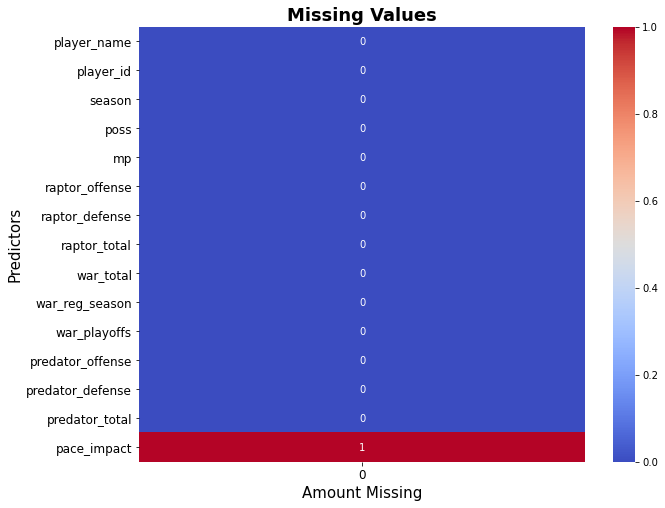

In [6]:
fig, ax = plt.subplots(figsize = (10, 8))
ax = sns.heatmap(nbadf.isna().sum().to_frame(),annot=True,fmt='d',cmap='coolwarm')
ax.set_xlabel('Amount Missing', fontdict = {'fontsize': 15})
ax.set_ylabel('Predictors', fontdict = {'fontsize': 15})
ax.set_title('Missing Values', fontweight='bold', fontdict = {'fontsize': 18})
plt.tick_params(axis='both', labelsize=12)
plt.show()

- Pretty clean data set overall 
- Will look into the columns with missing values but will probably end up dropping them overall since there are only a few

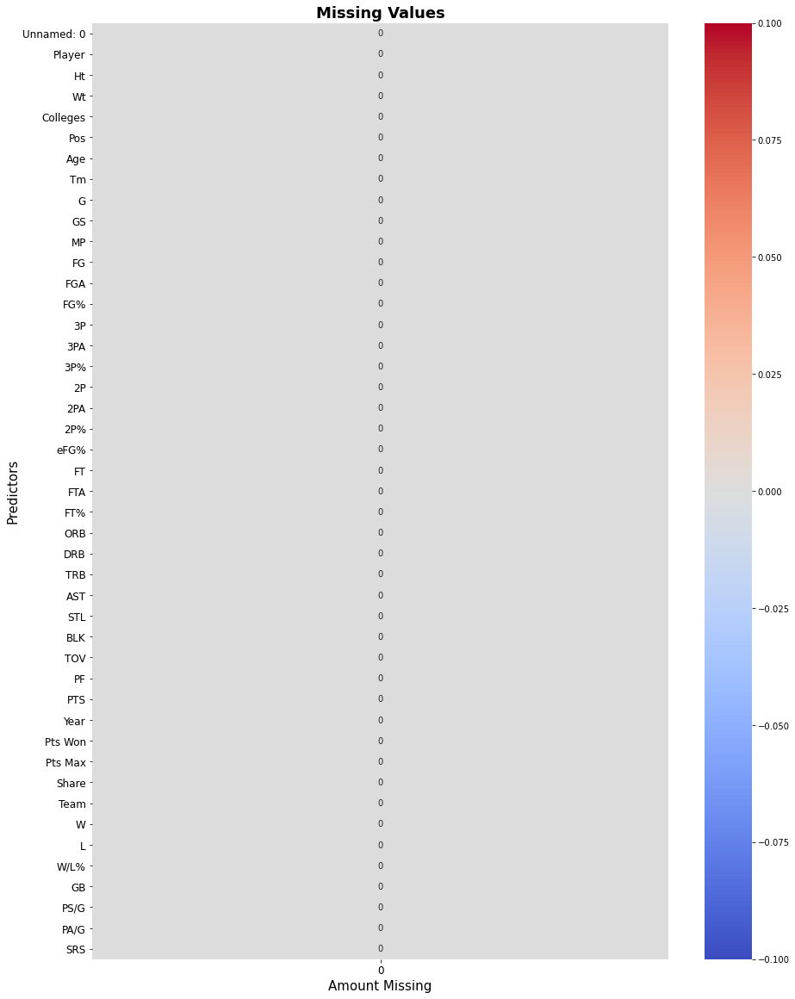

In [7]:
fig, ax = plt.subplots(figsize = (15, 20))
ax = sns.heatmap(nbadf1.isna().sum().to_frame(),annot=True,fmt='d',cmap='coolwarm')
ax.set_xlabel('Amount Missing', fontdict = {'fontsize': 15})
ax.set_ylabel('Predictors', fontdict = {'fontsize': 15})
ax.set_title('Missing Values', fontweight='bold', fontdict = {'fontsize': 18})
plt.tick_params(axis='both', labelsize=12)
plt.show()

In [8]:
#Checking missing values for war total
nbadf['war_total'].value_counts()

 0.000000     4
 2.523431     1
-0.043789     1
 0.757009     1
 2.840457     1
             ..
 15.749734    1
-0.951972     1
 0.677589     1
-0.047808     1
 0.269727     1
Name: war_total, Length: 19156, dtype: int64

In [9]:
#Checking missing values for war regular season 
nbadf['war_reg_season'].value_counts()

 0.000000    15
 1.344370     1
 1.014702     1
-2.287140     1
 2.249053     1
             ..
-0.737437     1
-1.010249     1
 0.336001     1
 3.499848     1
 1.799440     1
Name: war_reg_season, Length: 19145, dtype: int64

In [10]:
# Looking at only the float values since they are the only ones with nulls
nba.describe(include='float64')

,raptor_offense,raptor_defense,raptor_total,war_total,war_reg_season,war_playoffs,predator_offense,predator_defense,predator_total,pace_impact,Unnamed: 0,Wt,Age,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Year,Pts Won,Pts Max,Share,W,L,W/L%,GB,PS/G,PA/G,SRS
count,169653.000000,169653.000000,169653.000000,169653.000000,169653.000000,169653.000000,169653.000000,169653.000000,169653.000000,169652.000000,168418.000000,168418.00000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000,168418.000000
mean,-0.706521,-0.121445,-0.827966,2.756127,2.482999,0.273128,-0.715808,-0.237847,-0.953655,0.117550,9067.579594,215.71655,27.644973,59.962765,34.109151,23.340284,3.763040,8.157451,0.451384,0.491700,1.408994,0.225053,3.270663,6.747261,0.471867,0.480606,1.925574,2.549882,0.726679,1.191628,2.972143,4.162383,2.262100,0.775530,0.505567,1.458102,2.136143,9.943004,2001.375126,10.846342,63.945707,0.010123,40.945142,39.317353,0.510086,14.937011,102.001788,101.716373,0.274423
std,2.986343,2.001752,3.774492,3.972267,3.499373,0.710940,2.873653,1.941074,3.829087,0.708849,5211.706096,27.28869,4.353728,22.681753,31.241148,9.789858,2.399021,4.930044,0.078740,0.662852,1.749580,0.176923,2.273206,4.460589,0.082102,0.078340,1.572353,1.988660,0.152757,0.931619,1.924632,2.719459,2.029428,0.495096,0.582613,0.858457,0.820691,6.428381,11.233183,83.528402,255.863429,0.075824,12.740880,12.691347,0.153333,12.842805,7.148918,7.194347,4.445221
min,-82.192072,-56.982520,-103.084801,-7.382978,-7.382978,-1.376520,-71.510086,-37.871745,-101.442650,-7.191955,0.000000,133.00000,18.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1980.000000,0.000000,0.000000,0.000000,7.000000,9.000000,0.106000,0.000000,81.900000,83.400000,-14.680000
25%,-2.316269,-1.199879,-2.771117,-0.003777,-0.006200,0.000000,-2.345446,-1.312134,-3.111316,-0.274467,4589.000000,195.00000,24.000000,47.000000,3.000000,15.500000,1.800000,4.200000,0.416000,0.000000,0.000000,0.000000,1.500000,3.200000,0.441000,0.452000,0.800000,1.100000,0.676000,0.500000,1.600000,2.100000,0.800000,0.400000,0.100000,0.800000,1.600000,4.800000,1992.000000,0.000000,0.000000,0.000000,31.000000,29.000000,0.402000,3.000000,96.700000,96.500000,-2.660000
50%,-0.643953,-0.216323,-0.750228,1.408338,1.316375,0.000000,-0.711535,-0.274665,-0.894535,0.032505,9058.000000,215.00000,27.000000,68.000000,25.000000,23.700000,3.300000,7.300000,0.454000,0.100000,0.600000,0.278000,2.800000,5.700000,0.477000,0.485000,1.500000,2.000000,0.756000,0.900000,2.500000,3.500000,1.700000,0.700000,0.300000,1.300000,2.100000,8.700000,2002.000000,0.000000,0.000000,0.000000,42.000000,39.000000,0.524000,13.000000,101.400000,101.400000,0.480000
75%,0.967409,0.885470,1.277297,4.312263,3.978250,0.219455,0.948382,0.859909,1.307584,0.410035,13648.750000,235.00000,31.000000,79.000000,67.000000,31.800000,5.300000,11.400000,0.492000,0.800000,2.400000,0.358000,4.600000,9.500000,0.510000,0.518000,2.700000,3.500000,0.817000,1.700000,3.900000,5.600000,3.000000,1.000000,0.600000,2.000000,2.700000,14.000000,2011.000000,0.000000,0.000000,0.000000,50.000000,48.000000,0.622000,24.000000,106.900000,106.800000,3.560000
max,53.228864,62.469205,72.622361,28.762877,24.355978,7.006934,42.890281,42.989063,49.106166,23.732063,17975.000000,360.00000,44.000000,85.000000,84.000000,43.700000,13.400000,27.800000,1.000000,5.3

- Doesn't make sense to impute these missing values with a specified value because its literally 2 missing values at most out of almost 160,000 inputs.
- Will ultimately just drop these these values overall 

# Data Preparation 

In [11]:
# Drop all missing values from columns with NaNs
nba = nba.dropna()

In [12]:
# Dropping 'id' and Unnamed since we will not be working with these columns
nba.drop(['player_id','Unnamed: 0'], axis=1, inplace=True)

In [13]:
#Check data after made changes 
nba.isna().sum()

player_name         0
season              0
poss                0
mp                  0
raptor_offense      0
raptor_defense      0
raptor_total        0
war_total           0
war_reg_season      0
war_playoffs        0
predator_offense    0
predator_defense    0
predator_total      0
pace_impact         0
Player              0
Ht                  0
Wt                  0
Colleges            0
Pos                 0
Age                 0
Tm                  0
G                   0
GS                  0
MP                  0
FG                  0
FGA                 0
FG%                 0
3P                  0
3PA                 0
3P%                 0
2P                  0
2PA                 0
2P%                 0
eFG%                0
FT                  0
FTA                 0
FT%                 0
ORB                 0
DRB                 0
TRB                 0
AST                 0
STL                 0
BLK                 0
TOV                 0
PF                  0
PTS       

In [14]:
#Compare MJ era with New era 
mjera= nba[(nba['Year']>1984)&(nba['Year']<2003)]
newera= nba[(nba['Year']>2013)&(nba['Year']<2022)]

## Explore Categorical Columns

### Checking the value counts for each categorical feature

In [15]:
#Separate categorical columns
cat_cols = nba.select_dtypes(include = ['object']).columns
cat_cols

Index(['player_name', 'Player', 'Ht', 'Colleges', 'Pos', 'Tm', 'Team'], dtype='object')

In [16]:
#Create for loop to print value counts
for col in cat_cols:
    values = nba[col].value_counts()
    print(values, "\n")

Eddie Johnson         1350
Charles Jones         1323
Mike Dunleavy         1196
Gerald Henderson       882
Charles Smith          867
                      ... 
Vassilis Spanoulis       1
Ricky Wilson             1
Warren Kidd              1
Duck Williams            1
Jacob Wiley              1
Name: player_name, Length: 3096, dtype: int64 

Eddie Johnson         1350
Charles Jones         1323
Mike Dunleavy         1196
Gerald Henderson       882
Charles Smith          867
                      ... 
Vassilis Spanoulis       1
Ricky Wilson             1
Warren Kidd              1
Duck Williams            1
Jacob Wiley              1
Name: Player, Length: 3096, dtype: int64 

6-9     20251
6-7     17493
6-8     16550
6-10    16267
6-6     14726
6-11    13535
6-3     12584
6-5      9889
6-4      9566
7-0      8930
6-1      8091
6-2      7786
6-0      4465
7-1      2669
5-11     1361
7-2      1225
5-10     1034
7-3       378
7-4       350
5-9       265
7-6       214
5-3       196
5-5    

- Can see that there are values of teams that don't exist anymore.
- Being that we are only evaluating players, the teams that they played on don't matter as much. 

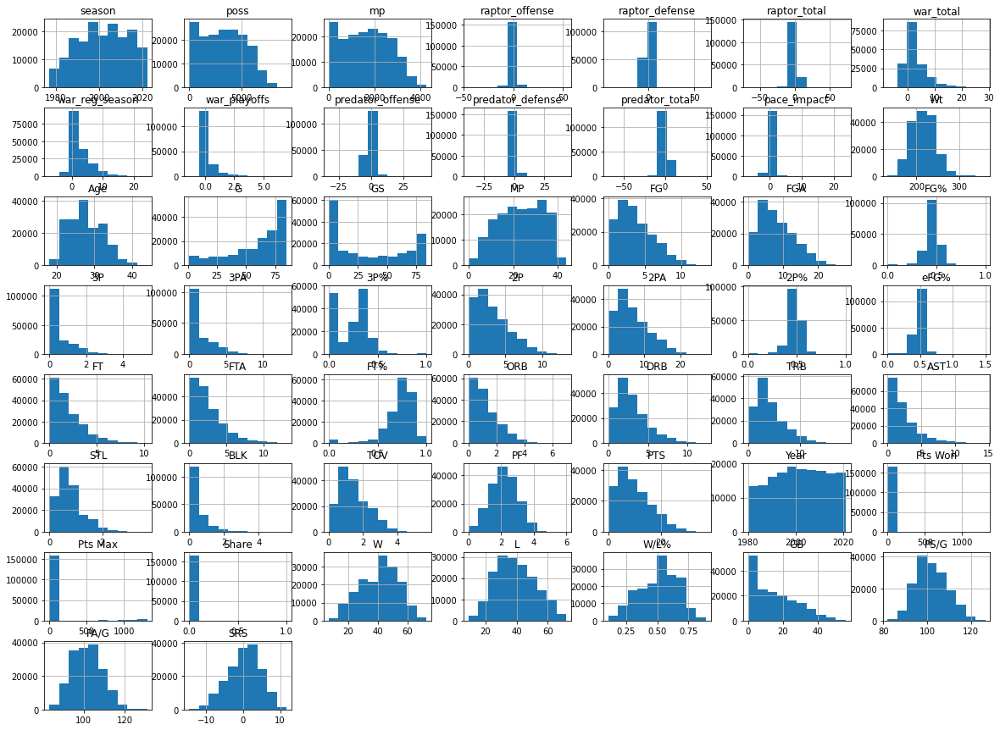

In [17]:
nba.hist(figsize = (20,15))
plt.show()

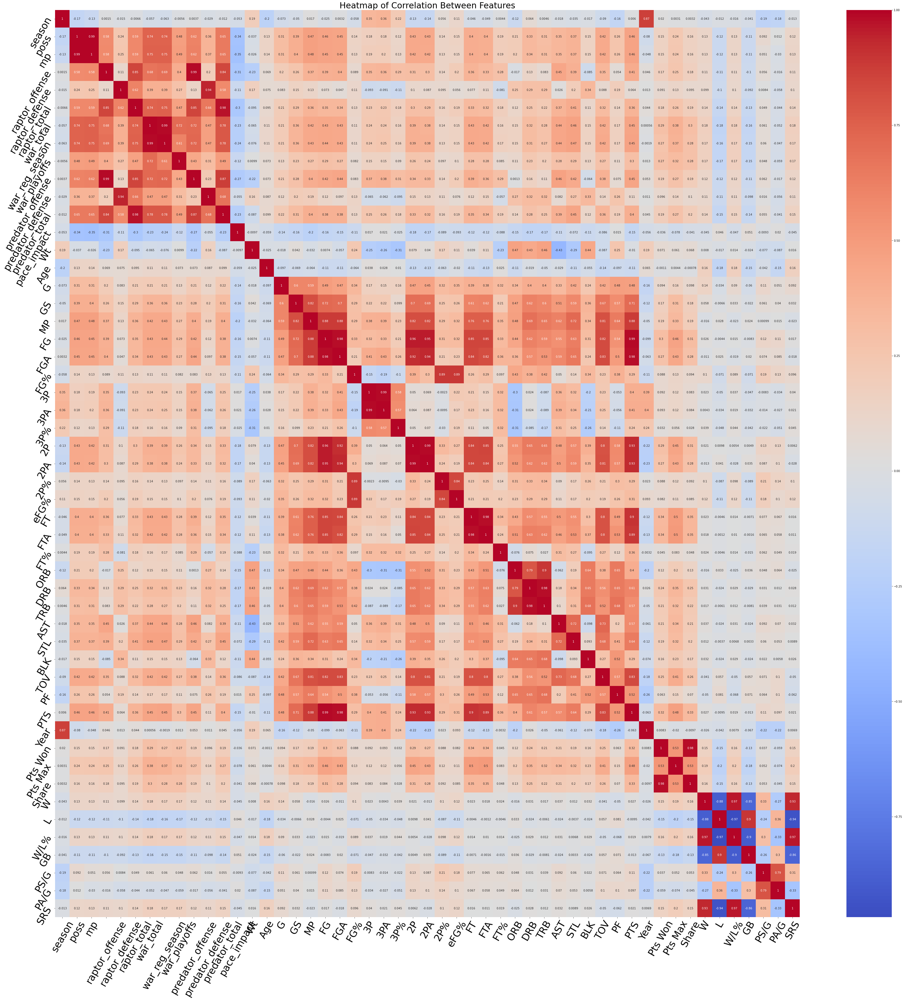

In [18]:
# set up figure size
fig, ax = plt.subplots(figsize=(60, 60))

# set up correlation matrix
corr = nba.corr()

sns.heatmap(corr, cmap = 'coolwarm', annot = True)

# Customize the plot appearance
ax.set_title("Heatmap of Correlation Between Features", size=30);
plt.xticks(rotation=60, size=35)
plt.yticks(rotation=60, size=35)

cmap = sns.diverging_palette(230, 20, as_cmap=True)

plt.show()

In [19]:
# Check value counts for position
nba.Pos.value_counts()

PF       35321
C        34533
PG       33101
SF       31727
SG       31630
C-PF       313
SF-SG      307
PF-C       289
PG-SG      275
PF-SF      214
SG-PG      213
SG-SF      187
SF-PF      183
SG-PF      100
PG-SF       13
SF-C        11
Name: Pos, dtype: int64

Can see that their are multiple positions for each position. Will decide to either combine some of these positions into one, or keep them to show that some players aren't subjected to just one position. 

In [20]:
pos_dict = {'SG' : 'Guard', 'PG': 'Guard', 'SF': 'Forward', 'PF': 'Forward'}

nba['Pos'].map(pos_dict)

0         Forward
1         Forward
2         Forward
3         Forward
4         Forward
           ...   
169648        NaN
169649        NaN
169650        NaN
169651        NaN
169652        NaN
Name: Pos, Length: 168417, dtype: object

In [21]:
#Define column that returns positions of guard, forward, and center 
def position(x):
    if x=='SG':
        return ('Guard')
    if x=='PG':
        return('Guard')
    if (x=='SF')| (x=='PF'):
        return('Forward')
    else:
        return('Center')
nba['Position']=nba['Pos'].apply(position)

In [22]:
#making new variables that combine stats
mjera['PPG']=mjera['PTS']/mjera['G']
mjera['PPG']=round(mjera['PPG'],1)
mjera['APG']=mjera['AST']/mjera['G']
mjera['RPG']=mjera['TRB']/mjera['G']
newera['PPG']=newera['PTS']/newera['G']
newera['PPG']=round(newera['PPG'],1)
newera['APG']=newera['AST']/newera['G']
newera['RPG']=newera['TRB']/newera['G']
newera['MPG']=newera['MP']/newera['G']
mjera['MPG']=mjera['MP']/mjera['G']
mjera['BPG']=mjera['BLK']/mjera['G']
newera['BPG']=newera['BLK']/newera['G']
mjera['SPG']=mjera['STL']/mjera['G']
newera['SPG']=newera['STL']/newera['G']
mjera['PFPG']=mjera['PF']/mjera['G']
newera['PFPG']=newera['PF']/newera['G']
mjera['TPG']=mjera['TOV']/mjera['G']
newera['TPG']=newera['TOV']/newera['G']

In [23]:
# SORTING WITH MP over 15 to show players that averaged over 15 MP a game and at least 12 PPG
mjbest=mjera[(mjera['G']>15)&(mjera['MP']>15)&(mjera['PPG']>12)].sort_values('MP',ascending=False)
newbest=newera[(newera['G']>15)&(newera['MP']>15)&(newera['PPG']>12)].sort_values('MP',ascending=False)

In [24]:
# Decided to bump up MP to 20
mjper20=mjbest[mjbest['MP']>20]
newper20=newbest[newbest['MP']>20]

In [25]:
#Basic stats
mjper20=mjper20.reset_index()
newper20=newper20.reset_index()
columns=['Player','MP', 'PER', 'TS%',
       '3PAr', 'FTr', 'ORB%', 'DRB%', 'TRB%', 'AST%', 'STL%', 'BLK%', 'TOV%',
       'USG%',  'OWS', 'DWS', 'WS', 'WS/48', 'OBPM', 'DBPM',
       'BPM', 'VORP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA',
       '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL',
       'BLK', 'TOV', 'PF', 'PTS', 'PPG', 'APG', 'RPG', 'MPG','SPG','BPG','PFPG','TPG' ,'Position']

Text(0, 0.5, 'POINTS PER GAME')

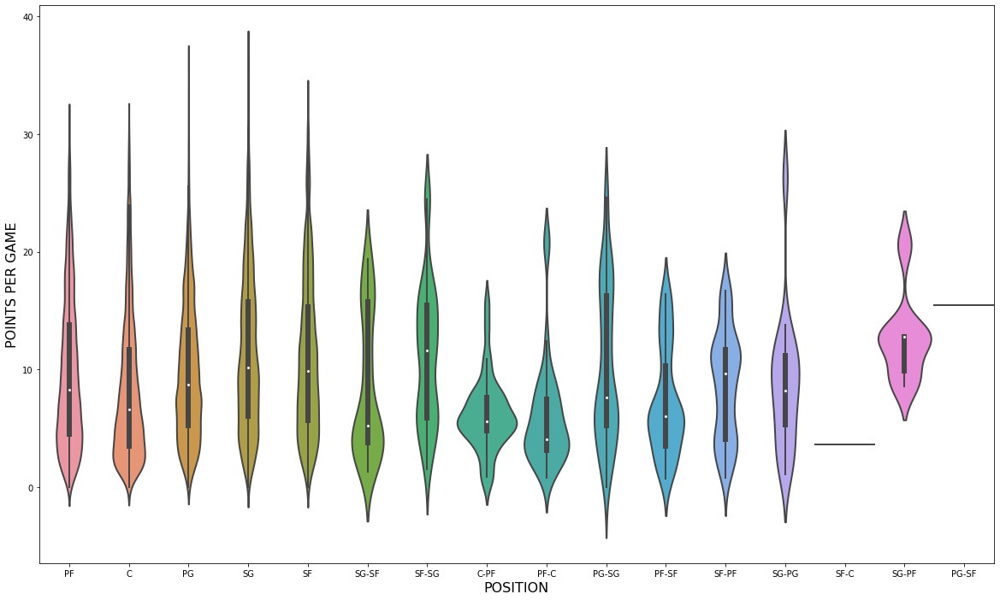

In [26]:
# create a Violinplot that shows points per game compared with Position
plt.figure(figsize=(20, 12))
sns.violinplot(x="Pos",y="PTS",data=nba,width=1,linewidth=2)
plt.xlabel('POSITION', fontsize=16)
plt.ylabel('POINTS PER GAME', fontsize=16)

Can see that PPG are a lot more prevalent in the guard and forward positions rather than the center positions. This could be because the game has changed a lot from big men being the focal point to now an after thought on offense. 

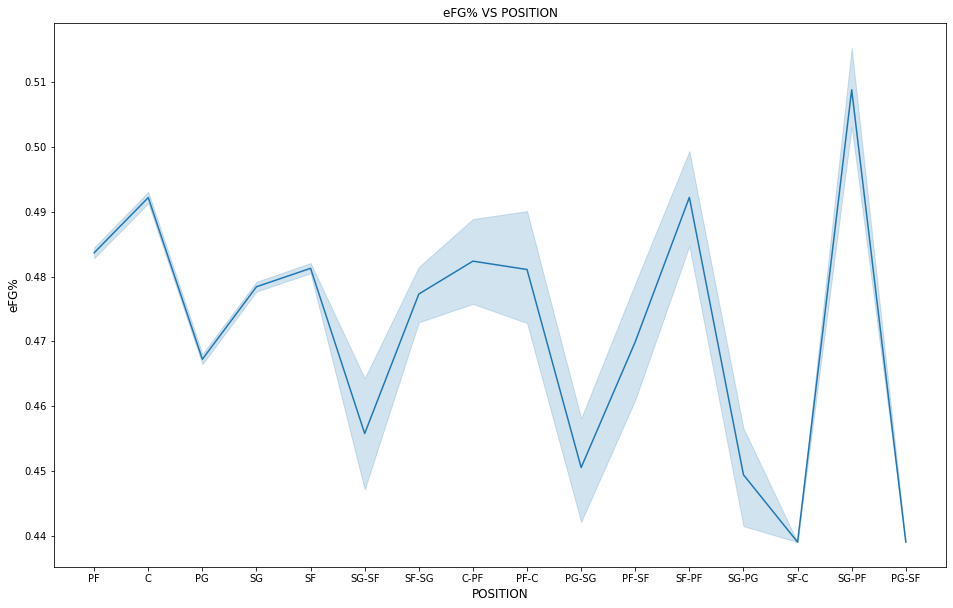

In [27]:
#Show eFG% vs Position
plt.figure(figsize=(16,10))
plt.style.use("default")
sns.lineplot(y="eFG%",x="Pos",data=nba)
plt.title("eFG% VS POSITION",fontsize=12)
plt.xlabel("POSITION",fontsize=12)
plt.ylabel("eFG%",fontsize=12)
plt.show()

Can see here that effective field goal percentage is shwon to increase once again in the forward positions. Any efg% over 50% is a great percentage. This could also be because wings are now the main important position on teams that include players who can score on all three levels - at the basket, 2P and 3P. Players like Giannis Antetokounmpo are the outliers here that make the graph spike in the forward positions because of how effective he can score at any position. 

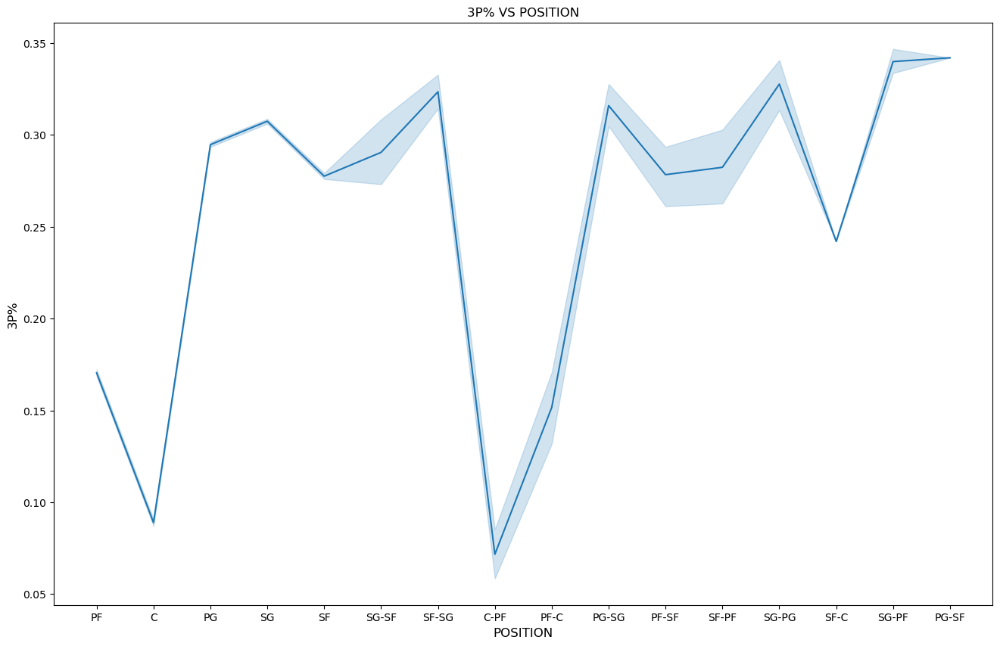

In [28]:
#Show 3P% vs Position
plt.figure(figsize=(16,10))
plt.style.use("default")
sns.lineplot(y="3P%",x="Pos",data=nba)
plt.title("3P% VS POSITION",fontsize=12)
plt.xlabel("POSITION",fontsize=12)
plt.ylabel("3P%",fontsize=12)
plt.show()

3P% is important because of how the game is played nowadays. Here you can see the percentage drop because PF-C are not shooting a great percentage but guards and forwards shoot very well. Any percentage over 30% is above average and should be noted 

# Deeper Look into Data

In [29]:
# Can see that there are a bunch of inputs from his entire career
MJ = (nba[nba['player_name']=='Michael Jordan']).mean()
MJ

season              1992.800000
poss                6322.266667
mp                  3232.333333
raptor_offense         5.782896
raptor_defense         2.074391
raptor_total           7.857287
war_total             18.690812
war_reg_season        15.512054
war_playoffs           3.178758
predator_offense       6.044732
predator_defense       2.249994
predator_total         8.294726
pace_impact           -0.160040
Wt                   198.000000
Age                   28.800000
G                     71.466667
GS                    69.266667
MP                    37.580000
FG                    11.093333
FGA                   22.700000
FG%                    0.488267
3P                     0.540000
3PA                    1.620000
3P%                    0.283933
2P                    10.566667
2PA                   21.073333
2P%                    0.500667
eFG%                   0.500000
FT                     6.713333
FTA                    8.066667
FT%                    0.830933
ORB     

Here I just wanted to take a deeper dive into one of the best players to ever play in Michael Jordan. Took the mean of his stats to wee exactly how his career looked throughout the years starting from his rookie year to when he retired the second time. 

In [30]:
mikej = MJ.to_frame().T

In [31]:
player_mean = nba.groupby('player_name').mean()

In [32]:
cosine = cosine_similarity(mikej, player_mean)

In [33]:
MJ_array = nba.iloc[:,3:].values

In [34]:
b = np.argsort(cosine)

In [35]:
b

array([[1311,   62, 2951, ..., 1854, 1649, 2097]])

In [36]:
player_mean.iloc[1939,:]

season              2019.000000
poss                 279.000000
mp                   129.333333
raptor_offense        -1.471577
raptor_defense        -1.252254
raptor_total          -2.723831
war_total              0.057625
war_reg_season         0.132926
war_playoffs          -0.075301
predator_offense      -1.510149
predator_defense      -2.375130
predator_total        -3.885279
pace_impact           -0.080277
Wt                   210.000000
Age                   25.000000
G                     17.666667
GS                     1.666667
MP                     6.966667
FG                     0.800000
FGA                    1.833333
FG%                    0.433667
3P                     0.600000
3PA                    1.433333
3P%                    0.407000
2P                     0.166667
2PA                    0.433333
2P%                    0.495000
eFG%                   0.591333
FT                     0.233333
FTA                    0.333333
FT%                    0.708333
ORB     

In [37]:
nba.head()


,player_name,season,poss,mp,raptor_offense,raptor_defense,raptor_total,war_total,war_reg_season,war_playoffs,predator_offense,predator_defense,predator_total,pace_impact,Player,Ht,Wt,Colleges,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Year,Pts Won,Pts Max,Share,Team,W,L,W/L%,GB,PS/G,PA/G,SRS,Position
0,Alaa Abdelnaby,1991,640,303,-3.93845,-0.510076,-4.448526,-0.265191,-0.226163,-0.039028,-3.905732,-1.696796,-5.602528,0.199241,Alaa Abdelnaby,6-10,240.0,Duke,PF,22.0,POR,43.0,0.0,6.7,1.3,2.7,0.474,0.0,0.0,0.0,1.3,2.7,0.474,0.474,0.6,1.0,0.568,0.6,1.4,2.1,0.3,0.1,0.3,0.5,0.9,3.1,1991.0,0.0,0.0,0.0,Portland Trail Blazers,63.0,19.0,0.768,0.0,114.7,106.0,8.47,Forward
1,Alaa Abdelnaby,1991,640,303,-3.93845,-0.510076,-4.448526,-0.265191,-0.226163,-0.039028,-3.905732,-1.696796,-5.602528,0.199241,Alaa Abdelnaby,6-10,240.0,Duke,PF,23.0,POR,71.0,1.0,13.2,2.5,5.1,0.493,0.0,0.0,0.0,2.5,5.1,0.493,0.493,1.1,1.4,0.752,1.1,2.5,3.7,0.4,0.4,0.2,0.9,1.9,6.1,1992.0,0.0,0.0,0.0,Portland Trail Blazers,57.0,25.0,0.695,0.0,111.4,104.1,6.94,Forward
2,Alaa Abdelnaby,1991,640,303,-3.93845,-0.510076,-4.448526,-0.265191,-0.226163,-0.039028,-3.905732,-1.696796,-5.602528,0.199241,Alaa Abdelnaby,6-10,240.0,Duke,PF,24.0,BOS,75.0,52.0,17.5,3.3,6.3,0.518,0.0,0.0,0.0,3.3,6.3,0.519,0.518,1.2,1.5,0.759,1.7,2.8,4.5,0.4,0.3,0.3,1.3,2.5,7.7,1993.0,0.0,0.0,0.0,Boston Celtics,48.0,34.0,0.585,12.0,103.7,102.8,0.93,Forward
3,Alaa Abdelnaby,1991,640,303,-3.93845,-0.510076,-4.448526,-0.265191,-0.226163,-0.039028,-3.905732,-1.696796,-5.602528,0.199241,Alaa Abdelnaby,6-10,240.0,Duke,PF,25.0,BOS,13.0,0.0,12.2,1.8,4.2,0.436,0.0,0.0,0.0,1.8,4.2,0.436,0.436,1.2,1.9,0.640,0.9,2.6,3.5,0.2,0.2,0.2,1.3,1.5,4.9,1994.0,0.0,0.0,0.0,Boston Celtics,32.0,50.0,0.390,25.0,100.8,105.1,-4.28,Forward
4,Alaa Abdelnaby,1991,640,303,-3.93845,-0.510076,-4.448526,-0.265191,-0.226163,-0.039028,-3.905732,-1.696796,-5.602528,0.199241,Alaa Abdelnaby,6-10,240.0,Duke,PF,26.0,PHI,54.0,0.0,9.4,2.2,4.3,0.511,0.0,0.0,0.0,2.2,4.2,0.515,0.511,0.4,0.6,0.571,0.7,1.4,2.1,0.2,0.3,0.2,0.8,1.9,4.7,1995.0,0.0,0.0,0.0,Philadelphia 76ers,24.0,58.0,0.293,33.0,95.4,100.4,-5.06,Forward


In [38]:
nba['Ht'] = nba['Ht'].apply(lambda x: str(x))
nba['Ht'] = nba['Ht'].apply(lambda x: x.replace("-",'.'))

In [39]:
nba.dropna(subset = ['Ht'], inplace = True)

In [40]:
nba['Ht'] =  nba['Ht'].apply(lambda x: float(x))

In [41]:
X = nba.drop(['Position', 'Colleges', 'Pos', 'Tm', 'Team', 'player_name', 'Player'],1)
y = nba['Position']

postion=  {'Guard':0, 'Forward':1, 'Center':2}
y = y.map(postion)
print(y)

0         1
1         1
2         1
3         1
4         1
         ..
169648    2
169649    2
169650    2
169651    2
169652    2
Name: Position, Length: 168417, dtype: int64


In [42]:
nba.dropna(inplace=True)
float64_cols = list(nba.select_dtypes(include='float64'))

nba[float64_cols] = nba[float64_cols].astype('float32')

In [43]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = .20, random_state=42)

# Model 1 - Random Forest

In [44]:
model1_pipeline = Pipeline([('scaler', StandardScaler()), 
                            ('classifier', RandomForestClassifier(random_state=42))])

In [45]:
model1_pipeline.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier', RandomForestClassifier(random_state=42))])

In [46]:
ypred = model1_pipeline.predict(X_test)

In [47]:
print(model1_pipeline.score(X_train, y_train))
print(model1_pipeline.score(X_test, y_test))
print(ypred)

1.0
0.9988718679491747
[1 0 0 ... 2 2 2]


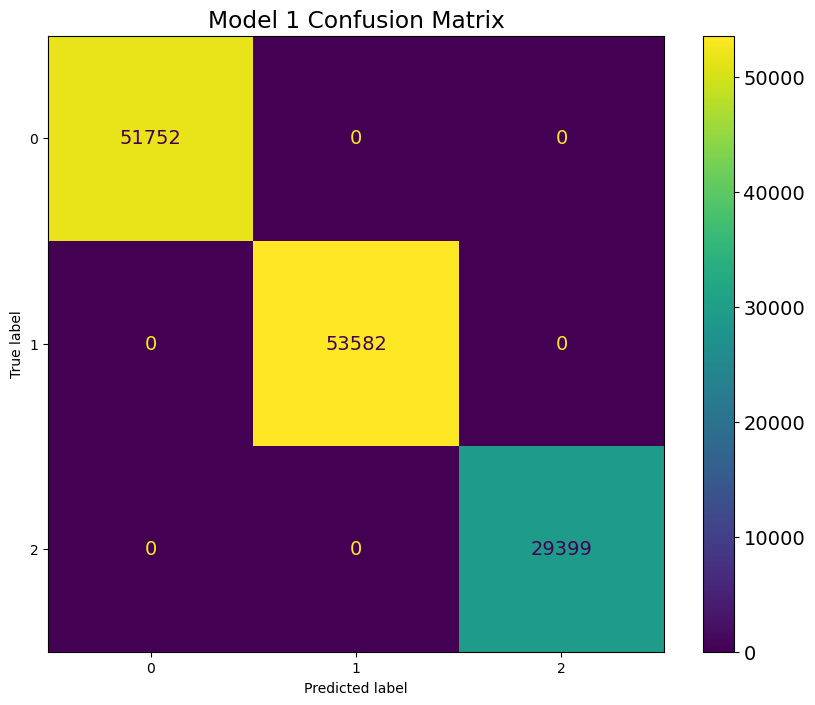

In [48]:
fig, ax = plt.subplots(figsize = (10, 8))
plt.rcParams.update({'font.size': 14})
ax.set_title('Model 1 Confusion Matrix')
plot_confusion_matrix(model1_pipeline, X_train, y_train, ax=ax);
# cm=metrics.confusion_matrix(y_test,ypred)
# print(cm)


In [49]:
print(classification_report(y_test, ypred, labels=[1, 2, 3]))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00     13466
           2       1.00      1.00      1.00      7239
           3       0.00      0.00      0.00         0

   micro avg       1.00      1.00      1.00     20705
   macro avg       0.67      0.67      0.67     20705
weighted avg       1.00      1.00      1.00     20705



In [50]:
model1_pipeline.steps[1][1].feature_importances_

array([0.0062239 , 0.00205524, 0.00210181, 0.00961586, 0.00633087,
       0.00250411, 0.00252283, 0.00227907, 0.00124821, 0.00734843,
       0.0050703 , 0.00290569, 0.00324586, 0.14664499, 0.15599867,
       0.01514518, 0.01011357, 0.01032894, 0.0162614 , 0.01154554,
       0.01671753, 0.01518564, 0.02690571, 0.0474818 , 0.02152383,
       0.01021974, 0.01219999, 0.01310074, 0.01197098, 0.01053496,
       0.01089182, 0.01599938, 0.04704448, 0.0293532 , 0.04322316,
       0.04749912, 0.02195454, 0.0454361 , 0.01485389, 0.01520435,
       0.01306558, 0.01610483, 0.00067688, 0.00077626, 0.0008316 ,
       0.00881744, 0.00876434, 0.00894204, 0.00841746, 0.01292766,
       0.01298708, 0.0108974 ])

In [51]:
tup1 = list(zip(X_test.columns,model1_pipeline.steps[1][1].feature_importances_))
tup1

[('season', 0.006223898431455141),
 ('poss', 0.0020552411642099544),
 ('mp', 0.0021018121951879723),
 ('raptor_offense', 0.009615862007673453),
 ('raptor_defense', 0.006330867763064952),
 ('raptor_total', 0.00250410630531401),
 ('war_total', 0.0025228325140139573),
 ('war_reg_season', 0.002279066763469747),
 ('war_playoffs', 0.0012482143878694092),
 ('predator_offense', 0.007348432295984935),
 ('predator_defense', 0.005070299082098443),
 ('predator_total', 0.0029056861317446644),
 ('pace_impact', 0.003245856784212225),
 ('Ht', 0.14664499063716263),
 ('Wt', 0.1559986652261008),
 ('Age', 0.015145179432111085),
 ('G', 0.01011356543874966),
 ('GS', 0.010328942510081478),
 ('MP', 0.016261401968026883),
 ('FG', 0.01154554439839176),
 ('FGA', 0.016717531434566637),
 ('FG%', 0.015185635289888175),
 ('3P', 0.02690571192258556),
 ('3PA', 0.04748180352372765),
 ('3P%', 0.021523834586642608),
 ('2P', 0.010219738684931317),
 ('2PA', 0.012199990332264573),
 ('2P%', 0.013100743987954099),
 ('eFG%', 0

In [52]:
sorted_list = sorted(
    tup1,
    key=lambda t: t[1],
    reverse=True)
    
sorted_list

[('Wt', 0.1559986652261008),
 ('Ht', 0.14664499063716263),
 ('AST', 0.04749911764788727),
 ('3PA', 0.04748180352372765),
 ('ORB', 0.04704447742578191),
 ('BLK', 0.04543610439151069),
 ('TRB', 0.043223161176126956),
 ('DRB', 0.02935320038588419),
 ('3P', 0.02690571192258556),
 ('STL', 0.02195454140000864),
 ('3P%', 0.021523834586642608),
 ('FGA', 0.016717531434566637),
 ('MP', 0.016261401968026883),
 ('Year', 0.016104829613375178),
 ('FT%', 0.015999381346723178),
 ('PF', 0.015204353048214391),
 ('FG%', 0.015185635289888175),
 ('Age', 0.015145179432111085),
 ('TOV', 0.014853893713429621),
 ('2P%', 0.013100743987954099),
 ('PTS', 0.013065578046707892),
 ('PA/G', 0.012987079343491833),
 ('PS/G', 0.012927657492786614),
 ('2PA', 0.012199990332264573),
 ('eFG%', 0.011970977392694428),
 ('FG', 0.01154554439839176),
 ('SRS', 0.010897404788179165),
 ('FTA', 0.010891816677935135),
 ('FT', 0.010534958481935674),
 ('GS', 0.010328942510081478),
 ('2P', 0.010219738684931317),
 ('G', 0.010113565438749

Can see that `Wt`, `Ht`, `Ast`, `3PA` are the top features. Makes sense in which if we are trying to predict exactly how similar a player is to another player these specific features will be weighted higher than others. Let's try a few more models to see if we can produce more realistic scores being that random forest naturally overfits

# Model 2 - Decision Tree

In [53]:
model2_pipeline = Pipeline([('scaler', StandardScaler()), 
                            ('classifier', DecisionTreeClassifier(random_state=42, max_depth=6, criterion='entropy'))])

In [54]:
model2_pipeline.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=6,
                                        random_state=42))])

In [55]:
ypred2 = model2_pipeline.predict(X_test)

In [56]:
print(model2_pipeline.score(X_train, y_train))
print(model2_pipeline.score(X_test, y_test))
test_mae = mean_absolute_error(ypred2, y_test)
print(test_mae)
print(ypred2)

0.8377754521906289
0.8398349364683529
0.16491509321933262
[1 0 0 ... 2 2 2]


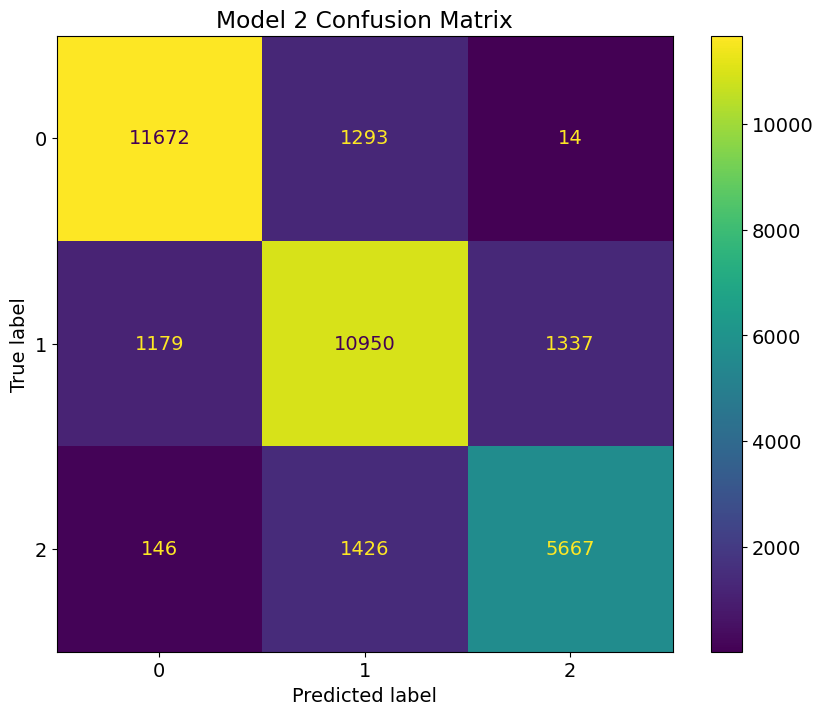

In [57]:
fig, ax = plt.subplots(figsize = (10, 8))
plt.rcParams.update({'font.size': 14})
ax.set_title('Model 2 Confusion Matrix')
plot_confusion_matrix(model2_pipeline, X_test, y_test, ax=ax);

In [71]:
print(classification_report(y_test, ypred2, labels=[1, 2, 3]))

              precision    recall  f1-score   support

           1       0.80      0.81      0.81     13466
           2       0.81      0.78      0.79      7239
           3       0.00      0.00      0.00         0

   micro avg       0.80      0.80      0.80     20705
   macro avg       0.54      0.53      0.53     20705
weighted avg       0.80      0.80      0.80     20705



In [75]:
tup2 = list(zip(X_test.columns,model2_pipeline.steps[1][1].feature_importances_))
tup2

[('season', 0.0),
 ('poss', 0.0),
 ('mp', 0.0),
 ('raptor_offense', 0.0),
 ('raptor_defense', 0.0),
 ('raptor_total', 0.0),
 ('war_total', 0.0),
 ('war_reg_season', 0.0),
 ('war_playoffs', 0.0),
 ('predator_offense', 0.0),
 ('predator_defense', 0.0),
 ('predator_total', 0.0),
 ('pace_impact', 0.0),
 ('Ht', 0.2891679745923603),
 ('Wt', 0.4789313692967033),
 ('Age', 0.00596404562008711),
 ('G', 0.0),
 ('GS', 0.0007559070199966214),
 ('MP', 0.002015290419375502),
 ('FG', 0.0),
 ('FGA', 0.0026982323088510307),
 ('FG%', 0.0),
 ('3P', 0.0),
 ('3PA', 0.12044260214372597),
 ('3P%', 0.0),
 ('2P', 0.000888653888158911),
 ('2PA', 0.0018507881616848982),
 ('2P%', 0.0),
 ('eFG%', 0.00046776942542439036),
 ('FT', 0.0),
 ('FTA', 0.0),
 ('FT%', 0.0005184578189123214),
 ('ORB', 0.01968363830577059),
 ('DRB', 0.0),
 ('TRB', 0.007191174690631572),
 ('AST', 0.02914630985666572),
 ('STL', 0.0),
 ('BLK', 0.032475969176767656),
 ('TOV', 0.0),
 ('PF', 0.0023483110341034363),
 ('PTS', 0.0),
 ('Year', 0.0033463

In [76]:
sorted_list = sorted(
    tup2,
    key=lambda t: t[1],
    reverse=True)
    
sorted_list

[('Wt', 0.4789313692967033),
 ('Ht', 0.2891679745923603),
 ('3PA', 0.12044260214372597),
 ('BLK', 0.032475969176767656),
 ('AST', 0.02914630985666572),
 ('ORB', 0.01968363830577059),
 ('TRB', 0.007191174690631572),
 ('Age', 0.00596404562008711),
 ('Year', 0.0033463168205183375),
 ('FGA', 0.0026982323088510307),
 ('PF', 0.0023483110341034363),
 ('PA/G', 0.002107189420262281),
 ('MP', 0.002015290419375502),
 ('2PA', 0.0018507881616848982),
 ('2P', 0.000888653888158911),
 ('GS', 0.0007559070199966214),
 ('FT%', 0.0005184578189123214),
 ('eFG%', 0.00046776942542439036),
 ('season', 0.0),
 ('poss', 0.0),
 ('mp', 0.0),
 ('raptor_offense', 0.0),
 ('raptor_defense', 0.0),
 ('raptor_total', 0.0),
 ('war_total', 0.0),
 ('war_reg_season', 0.0),
 ('war_playoffs', 0.0),
 ('predator_offense', 0.0),
 ('predator_defense', 0.0),
 ('predator_total', 0.0),
 ('pace_impact', 0.0),
 ('G', 0.0),
 ('FG', 0.0),
 ('FG%', 0.0),
 ('3P', 0.0),
 ('3P%', 0.0),
 ('2P%', 0.0),
 ('FT', 0.0),
 ('FTA', 0.0),
 ('DRB', 0.0

# Model 3 - Logistic Regression

In [59]:
model3_pipeline = Pipeline([('scaler', StandardScaler()),
                            ('classifier', LogisticRegression(random_state=42))])


In [60]:
# Fitting the training data
model3_pipeline.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('classifier', LogisticRegression(random_state=42))])

In [61]:
ypred3 = model3_pipeline.predict(X_test)

In [62]:
print(model3_pipeline.score(X_train, y_train))
print(model3_pipeline.score(X_test, y_test))
print(ypred3)

0.8293588059347005
0.8309880061750385
[1 0 0 ... 2 2 2]


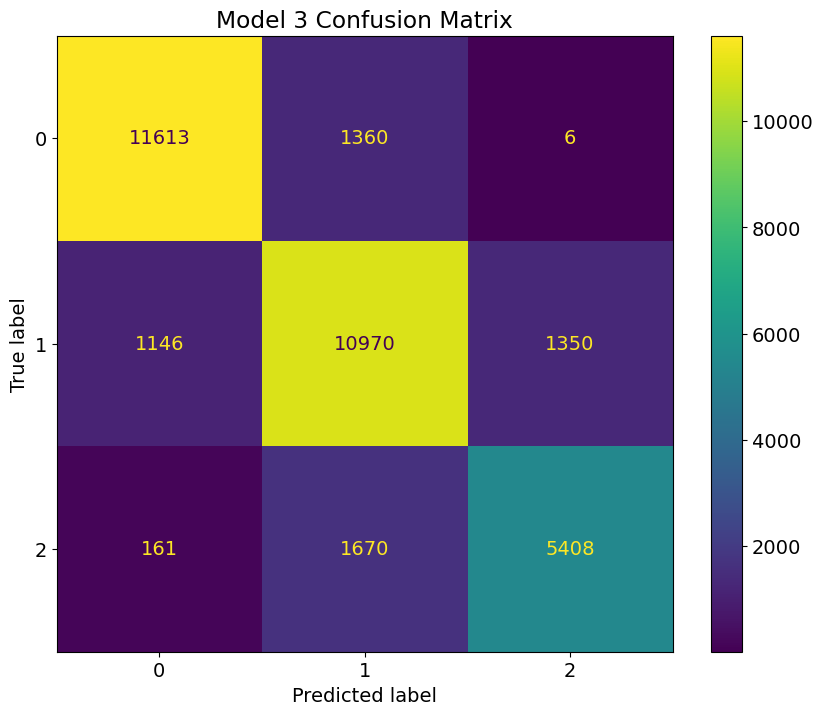

In [70]:
fig, ax = plt.subplots(figsize = (10, 8))
plt.rcParams.update({'font.size': 14})
ax.set_title('Model 3 Confusion Matrix')
plot_confusion_matrix(model3_pipeline, X_test, y_test, ax=ax);

In [72]:
print(classification_report(y_test, ypred3, labels=[1, 2, 3]))

              precision    recall  f1-score   support

           1       0.78      0.81      0.80     13466
           2       0.80      0.75      0.77      7239
           3       0.00      0.00      0.00         0

   micro avg       0.79      0.79      0.79     20705
   macro avg       0.53      0.52      0.52     20705
weighted avg       0.79      0.79      0.79     20705



# Model 4 - Naive Bayes

In [64]:
model4_NB = Pipeline(steps = [['scaler', StandardScaler()],
                                ['nb', GaussianNB()]])


In [66]:
# Fitting the training data
model4_NB.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()), ['nb', GaussianNB()]])

In [68]:
# Calculating y predictions
ypred4 = model4_NB.predict(X_test)

In [69]:
print(model4_NB.score(X_train, y_train))
print(model4_NB.score(X_test, y_test))
print(ypred4)

0.7014688309471325
0.7035090844317777
[0 0 0 ... 1 2 2]


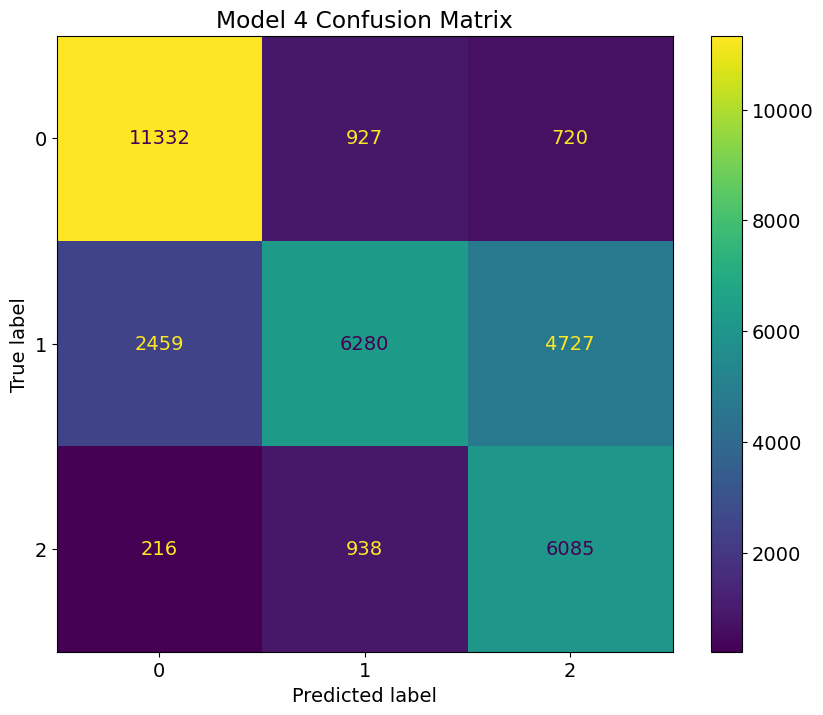

In [73]:
fig, ax = plt.subplots(figsize = (10, 8))
plt.rcParams.update({'font.size': 14})
ax.set_title('Model 4 Confusion Matrix')
plot_confusion_matrix(model4_NB, X_test, y_test, ax=ax);

In [74]:
print(classification_report(y_test, ypred4, labels=[1, 2, 3]))

              precision    recall  f1-score   support

           1       0.77      0.47      0.58     13466
           2       0.53      0.84      0.65      7239
           3       0.00      0.00      0.00         0

   micro avg       0.63      0.60      0.61     20705
   macro avg       0.43      0.44      0.41     20705
weighted avg       0.69      0.60      0.60     20705



Can see here that decision tree model would be more accurate to determine which stats are most important for predicting that position which will tell people what to focus on. 

# Recommendation System

In [386]:
# create subset of players and respective team name
nba = nba.drop_duplicates(subset =['player_name','Tm'])

In [387]:
#show how player and team name will be displayed 
nba[(nba['player_name'] =='Alaa Abdelnaby') & (nba['Tm'] == 'POR')]

,player_name,season,poss,mp,raptor_offense,raptor_defense,raptor_total,war_total,war_reg_season,war_playoffs,predator_offense,predator_defense,predator_total,pace_impact,Player,Ht,Wt,Colleges,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Year,Pts Won,Pts Max,Share,Team,W,L,W/L%,GB,PS/G,PA/G,SRS,Position
0,Alaa Abdelnaby,1991,640,303,-3.93845,-0.510076,-4.448526,-0.265191,-0.226163,-0.039028,-3.905732,-1.696796,-5.602528,0.199241,Alaa Abdelnaby,6.1,240.0,Duke,PF,22.0,POR,43.0,0.0,6.7,1.3,2.7,0.474,0.0,0.0,0.0,1.3,2.7,0.474,0.474,0.6,1.0,0.568,0.6,1.4,2.1,0.3,0.1,0.3,0.5,0.9,3.1,1991.0,0.0,0.0,0.0,Portland Trail Blazers,63.0,19.0,0.768,0.0,114.699997,106.0,8.47,Forward


In [388]:
# create a variable of all current players in the league 
current_players_df = nba.loc[nba['Year'] == 2021]
current_players_df

,player_name,season,poss,mp,raptor_offense,raptor_defense,raptor_total,war_total,war_reg_season,war_playoffs,predator_offense,predator_defense,predator_total,pace_impact,Player,Ht,Wt,Colleges,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Year,Pts Won,Pts Max,Share,Team,W,L,W/L%,GB,PS/G,PA/G,SRS,Position
431,Precious Achiuwa,2021,1581,749,-4.347596,0.954821,-3.392775,-0.246055,-0.246776,0.000721,-3.817713,0.474828,-3.342885,0.329157,Precious Achiuwa,6.80,225.0,Memphis,PF,21.0,MIA,61.0,4.0,12.100000,2.0,3.7,0.544,0.0,0.0,0.000,2.0,3.7,0.546,0.544,0.9,1.8,0.509,1.2,2.2,3.4,0.5,0.3,0.5,0.7,1.5,5.000000,2021.0,0.0,0.0,0.0,Miami Heat,40.0,32.0,0.556,1.0,108.099998,108.000000,-0.06,Forward
636,Jaylen Adams,2019,952,428,-2.377644,-3.734729,-6.112373,-0.733513,-0.733513,0.000000,-2.023145,-4.304853,-6.327998,-0.099018,Jaylen Adams,6.00,225.0,St. Bonaventure,PG,24.0,MIL,7.0,0.0,2.600000,0.1,1.1,0.125,0.0,0.3,0.000,0.1,0.9,0.167,0.125,0.0,0.0,0.000,0.0,0.4,0.4,0.3,0.0,0.0,0.0,0.1,0.300000,2021.0,0.0,0.0,0.0,Milwaukee Bucks,46.0,26.0,0.639,0.0,120.099998,114.199997,5.57,Guard
773,Steven Adams,2014,3078,1528,-1.477308,-0.300116,-1.777424,0.741984,1.087877,-0.345893,-1.739690,1.022962,-0.716729,-0.076885,Steven Adams,6.11,265.0,Pitt,C,27.0,NOP,58.0,58.0,27.700001,3.3,5.3,0.614,0.0,0.1,0.000,3.3,5.3,0.620,0.614,1.0,2.3,0.444,3.7,5.2,8.9,1.9,0.9,0.7,1.3,1.9,7.600000,2021.0,0.0,0.0,0.0,New Orleans Pelicans,31.0,41.0,0.431,11.0,114.599998,114.900002,-0.20,Center
874,Bam Adebayo,2018,2921,1445,-2.219373,1.039458,-1.179915,1.172123,1.348869,-0.176746,-2.719829,0.461894,-2.257935,-0.812342,Bam Adebayo,6.90,255.0,Kentucky,C,23.0,MIA,64.0,64.0,33.500000,7.1,12.5,0.570,0.0,0.1,0.250,7.1,12.4,0.573,0.571,4.4,5.5,0.799,2.2,6.7,9.0,5.4,1.2,1.0,2.6,2.3,18.700001,2021.0,0.0,0.0,0.0,Miami Heat,40.0,32.0,0.556,1.0,108.099998,108.000000,-0.06,Center
1549,LaMarcus Aldridge,2007,2590,1392,-0.343946,0.058657,-0.285289,1.746742,1.746742,0.000000,-0.545763,0.262266,-0.283497,-0.196254,LaMarcus Aldridge,6.11,250.0,Texas,C,35.0,BRK,26.0,23.0,25.900000,5.4,11.4,0.473,1.2,3.1,0.388,4.2,8.3,0.505,0.525,1.6,1.8,0.872,0.7,3.8,4.5,1.9,0.4,1.1,1.0,1.8,13.500000,2021.0,0.0,0.0,0.0,Brooklyn Nets,48.0,24.0,0.667,1.0,118.599998,114.099998,4.24,Center
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167650,Robert Woodard II,2021,103,45,1.237005,-4.341281,-3.104276,-0.008158,-0.008158,0.000000,2.395206,-7.233514,-4.838307,0.300160,Robert Woodard II,6.60,235.0,Mississippi State,SF,21.0,SAC,13.0,0.0,3.500000,0.6,1.5,0.400,0.1,0.5,0.167,0.5,1.1,0.500,0.425,0.2,0.6,0.375,0.3,0.9,1.2,0.2,0.0,0.2,0.1,0.3,1.500000,2021.0,0.0,0.0,0.0,Sacramento Kings,31.0,41.0,0.431,20.0,113.699997,117.400002,-3.45,Forward
167652,Christian Wood,2016,322,145,-2.492190,0.415727,-2.076463,0.050021,0.050021,0.000000,-1.338947,-0.786842,-2.125788,0.378577,Christian Wood,6.10,214.0,UNLV,C,25.0,HOU,41.0,41.0,32.299999,8.0,15.6,0.514,1.9,5.0,0.374,6.1,10.6,0.581,0.574,3.0,4.8,0.631,1.9,7.8,9.6,1.7,0.8,1.2,2.0,2.1,21.000000,2021.0,0.0,0.0,0.0,Houston Rockets,17.0,55.0,0.236,25.0,108.800003,116.699997,-7.50,Center
168502,Delon Wright,2016,541,270,-0.513512,1.902009,1.388498,0.574754,0.368324,0.206430,-0.736868,-0.407367,-1.144235,-0.776551,Delon Wright,6.50,185.0,Utah,SG-PG,28.0,SAC,63.0,39.0,27.700001,3.8,8.2,0.463,1.0,2.7,0.372,2.8,5.5,0.509,0.525,1.6,2.0,0.802,1.0,3.2,4.3,4.4,1.6,0.5,1.3,1.2,10.200000,2021.0,0.0,0.0,0.0,Sacramento Kings,31.0,41.0,0.431,20.0,113.699997,117.400002,-3.45,Center
169224,Thaddeus Young,2008,3250,1714,1.192858,0.912783,2.105640,4.266450,3.575559,0.690891,0.915089,0.646938,1.562027,-0.264815,Thaddeus Young,6.80,235.0,Georgia Tech,PF,32.0,CHI,68.0,23.0,24.299999,5.4,9.7,0.559,0.2,0.7,0.267,5.3,9.1,0.580,0.568,1.0,1.7,0.628,2.5,3.8,6.2,4.3,1.

In [389]:
# create function thatthe cosine sim from one players stat vector compared it to all the other players stat vector and took the one with the highest similarity
def get_player_sim(name, team_name):
    player_vec = nba[(nba['player_name'] == name) & (nba['Tm'] == team_name)]
    play_vec = player_vec.select_dtypes('number')
    sims =  cosine_similarity(play_vec, current_players_df.select_dtypes('number'))
    high_sims = np.argmax(sims)
    return current_players_df.iloc[high_sims,:].to_frame().T
    

In [391]:
# Here you can type in any player in the past or present that will show its respective player similarity compared stats
get_player_sim('Michael Jordan', 'WAS')

,player_name,season,poss,mp,raptor_offense,raptor_defense,raptor_total,war_total,war_reg_season,war_playoffs,predator_offense,predator_defense,predator_total,pace_impact,Player,Ht,Wt,Colleges,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,3P,3PA,3P%,2P,2PA,2P%,eFG%,FT,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS,Year,Pts Won,Pts Max,Share,Team,W,L,W/L%,GB,PS/G,PA/G,SRS,Position
159487,Russell Westbrook,2009,5262,2668,-0.136108,0.19755,0.0614418,3.81633,3.81633,0,-0.112249,0.17112,0.058871,-0.257986,Russell Westbrook,6.3,200,UCLA,PG,32,WAS,65,65,36.4,8.4,19,0.439,1.3,4.2,0.315,7,14.8,0.475,0.474,4.2,6.4,0.656,1.7,9.9,11.5,11.7,1.4,0.4,4.8,2.9,22.2,2021,5,1010,0.005,Washington Wizards,34,38,0.472,7,116.6,118.5,-1.85,Guard


What you can see here is that any player in the past or present can be compared to current players via stats. By taking the cosine similarity of each player it allows us to see clearly what players are the most similar to each other. This is the system that can possibly help front office executives to get a better understanding of where players lie stats wise 

# Conclusions / Next Steps

While my machine learning classification project proved that it can correctly predict the features that are most important in a players position, we have no information on how a players salary comes into play. In other words, players who get paid more usually play more.

Furthermore, an additional limitation to our project is that because salary was not taken into effect, we cant see if replacing a star player can save a team money in the long run. Being that the NBA has a salary cap, it makes it that much harder to build a team that can compete for a title. 

Another limitation of our project is that we do not know the team stats and coaching strategies. Some coaching strategies allow for players to sag off on defense because they're guarding a weaker player and things of that sort which may look like the player is bad of defense when hes really not. Just a few things to consider when taking stats into account is that they eye test is something that cannot be measured. 